In [1]:
import pickle
import numpy as np
import os
import pandas as pd
from IPython.display import display, Image
Annotation_dic=pickle.load(open("results.pkl",'rb'))
folders=pd.read_csv("test-set.csv").values[:,:]

def to_binary(Y):
    Y=np.array(Y)
    nb_clusters=len(set(Y))
    clusters=[]
    majority=None
    nb_points=0
    for i in range(nb_clusters):
        nb=np.sum((Y==i))
        if nb>=nb_points:
            nb_points=nb
            majority=i
    
    Y_binarized=np.array(Y==majority,dtype=int)
    return Y_binarized


folder  0  is being evaluated
folder  1  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  0


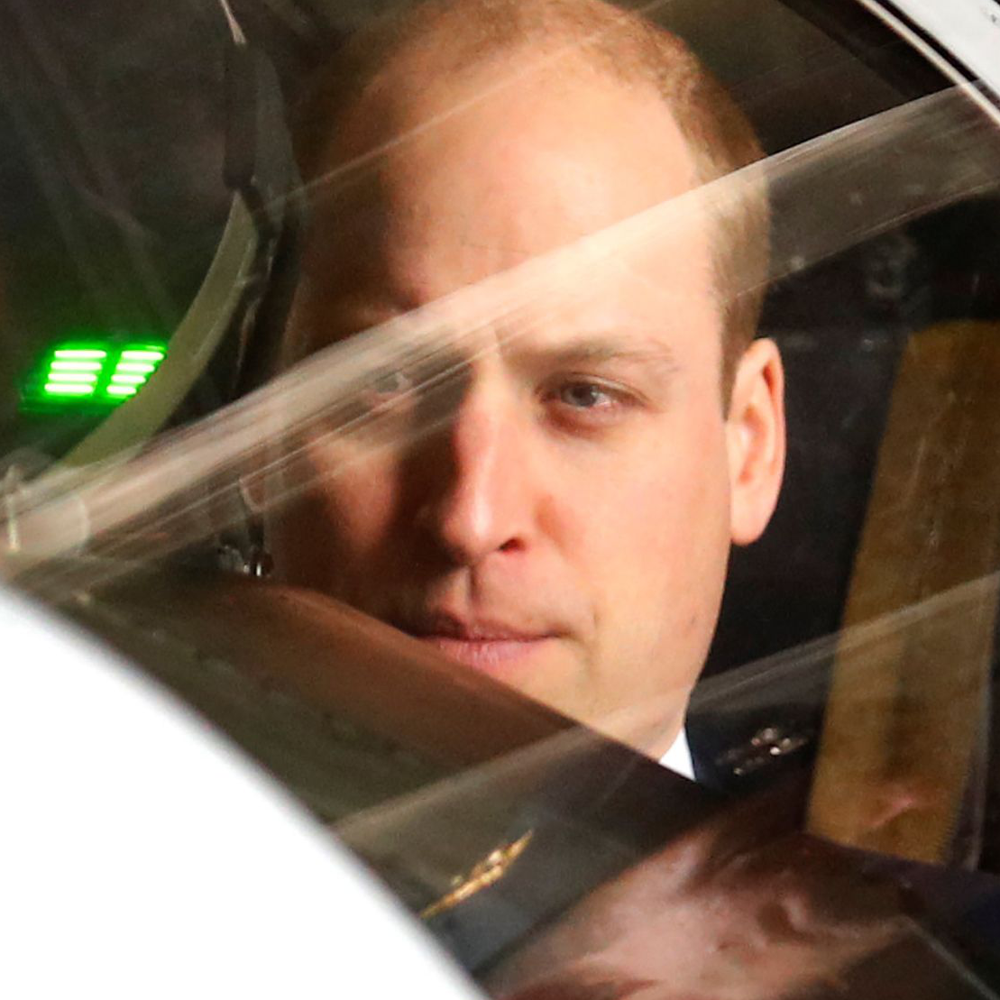

folder  2  is being evaluated
folder  3  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  0


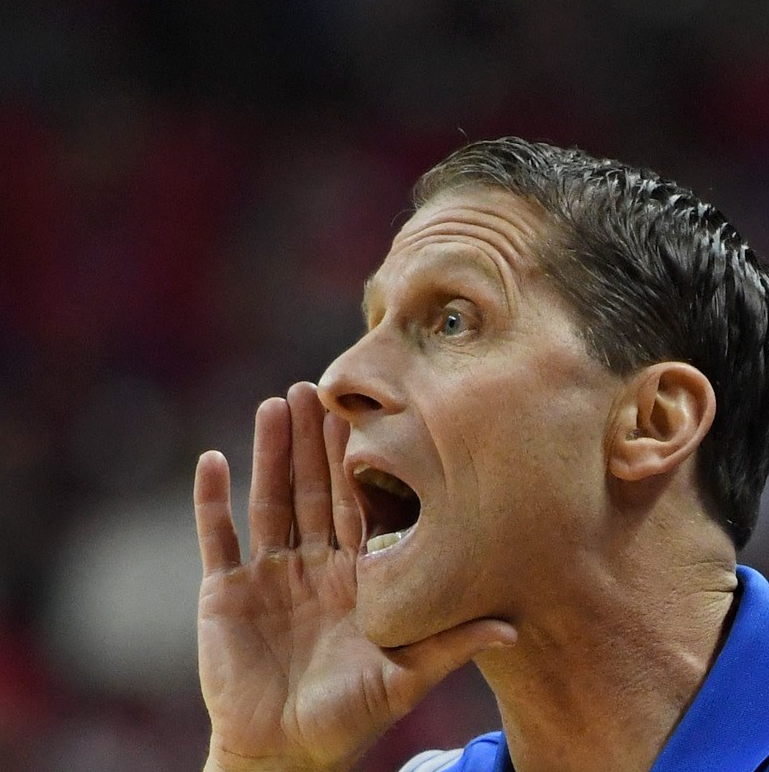

folder  4  is being evaluated
folder  5  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  0


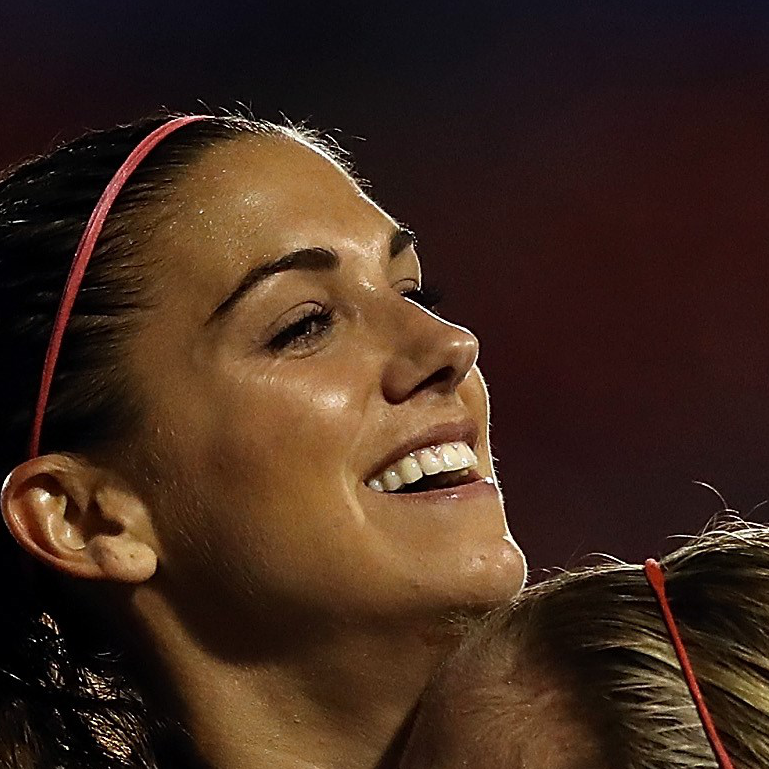

folder  6  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  0


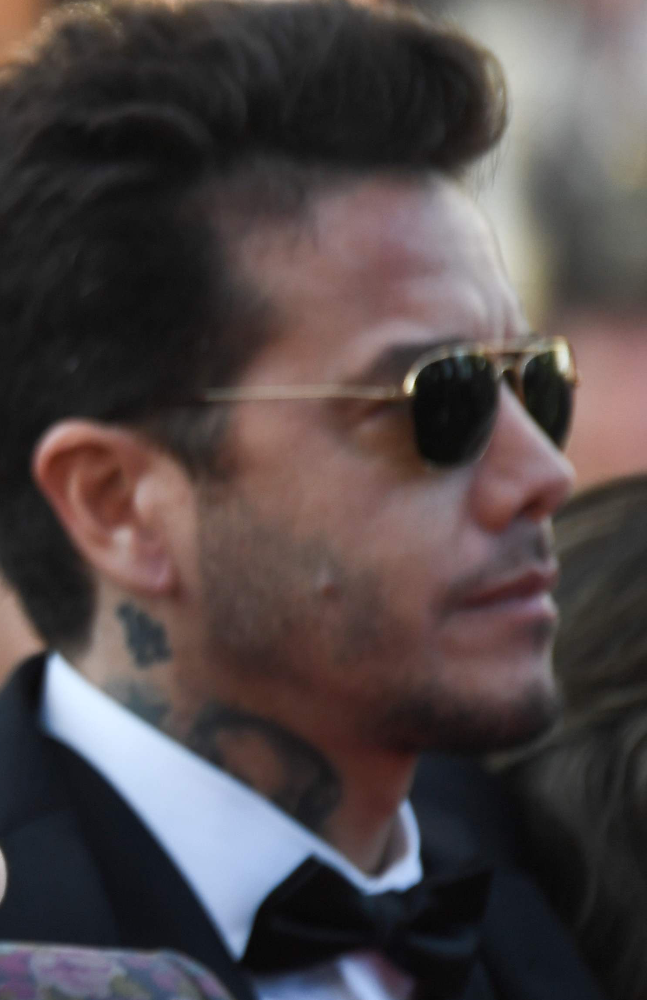

folder  7  is being evaluated
folder  8  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  2


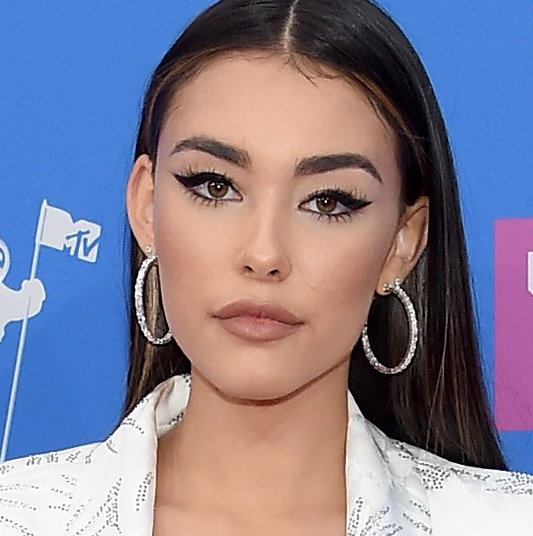

folder  9  is being evaluated
folder  10  is being evaluated
folder  11  is being evaluated
folder  12  is being evaluated
folder  13  is being evaluated
folder  14  is being evaluated
folder  15  is being evaluated
folder  16  is being evaluated
folder  17  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  0


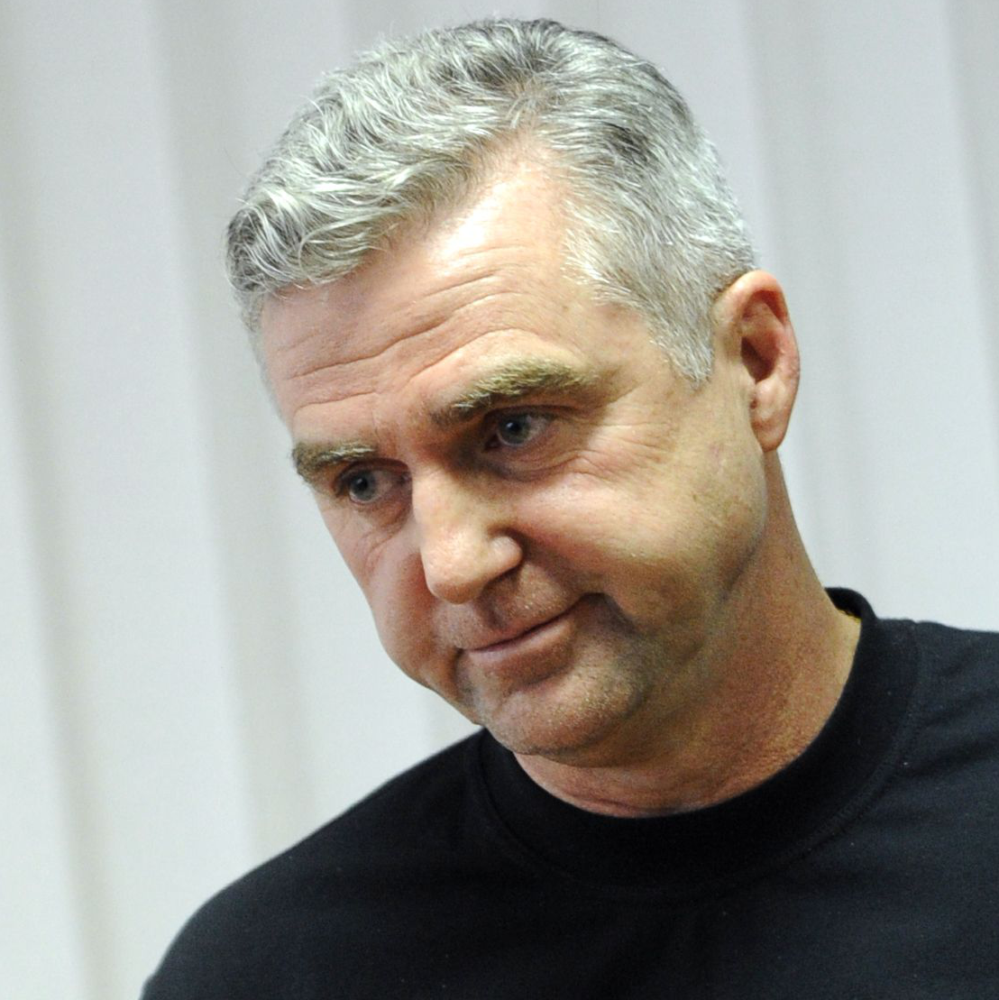

folder  18  is being evaluated
folder  19  is being evaluated
folder  20  is being evaluated
folder  21  is being evaluated
folder  22  is being evaluated
folder  23  is being evaluated
folder  24  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  0


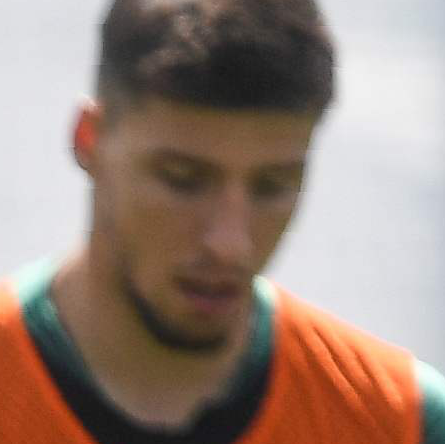

folder  25  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  0


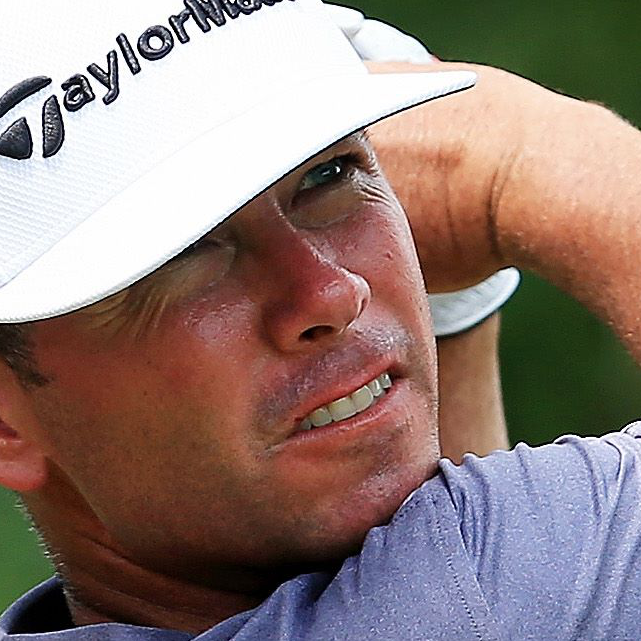

Cette photo est mal encodé par l'encodeur -> output shape :  0


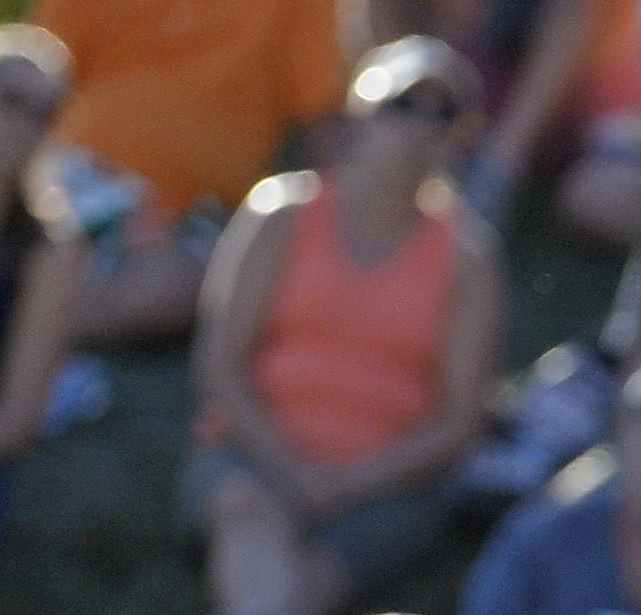

Cette photo est mal encodé par l'encodeur -> output shape :  0


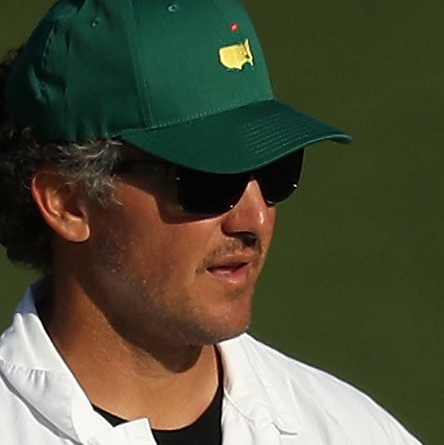

Cette photo est mal encodé par l'encodeur -> output shape :  0


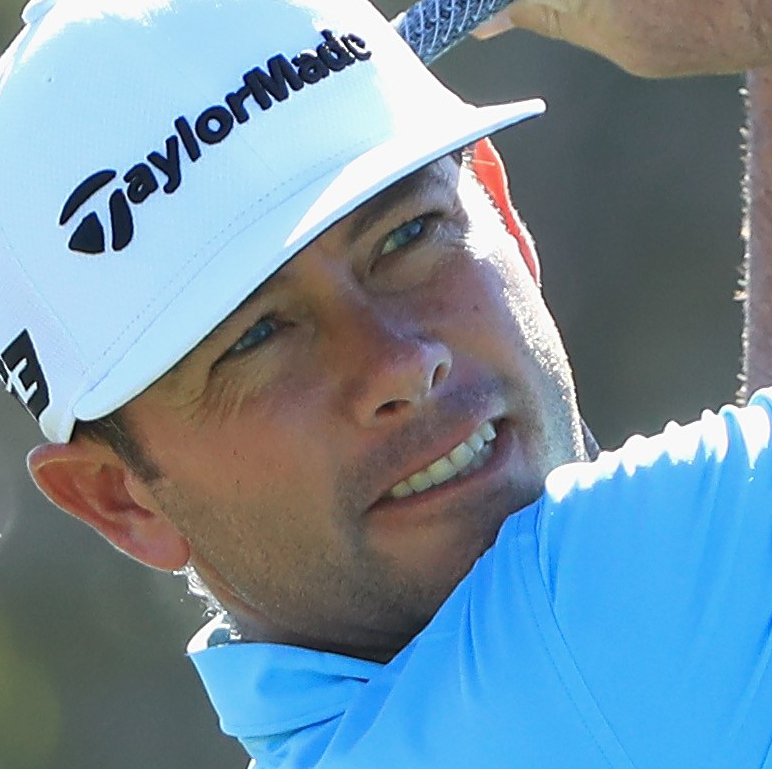

Cette photo est mal encodé par l'encodeur -> output shape :  0


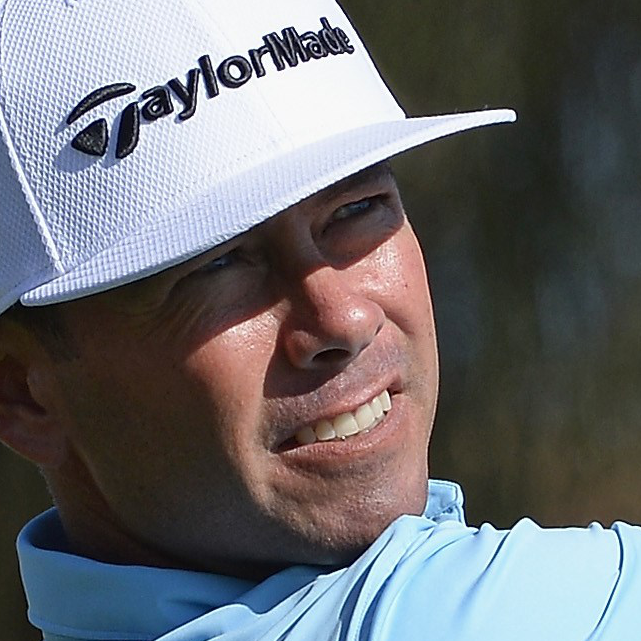

Cette photo est mal encodé par l'encodeur -> output shape :  0


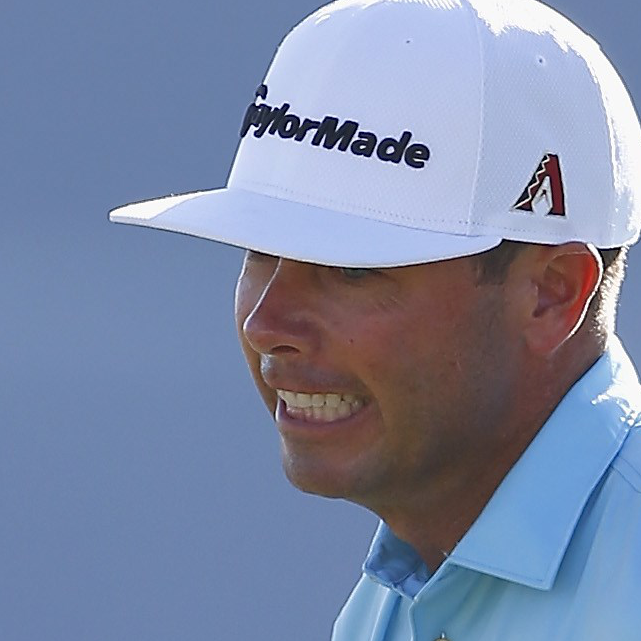

folder  26  is being evaluated
folder  27  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  2


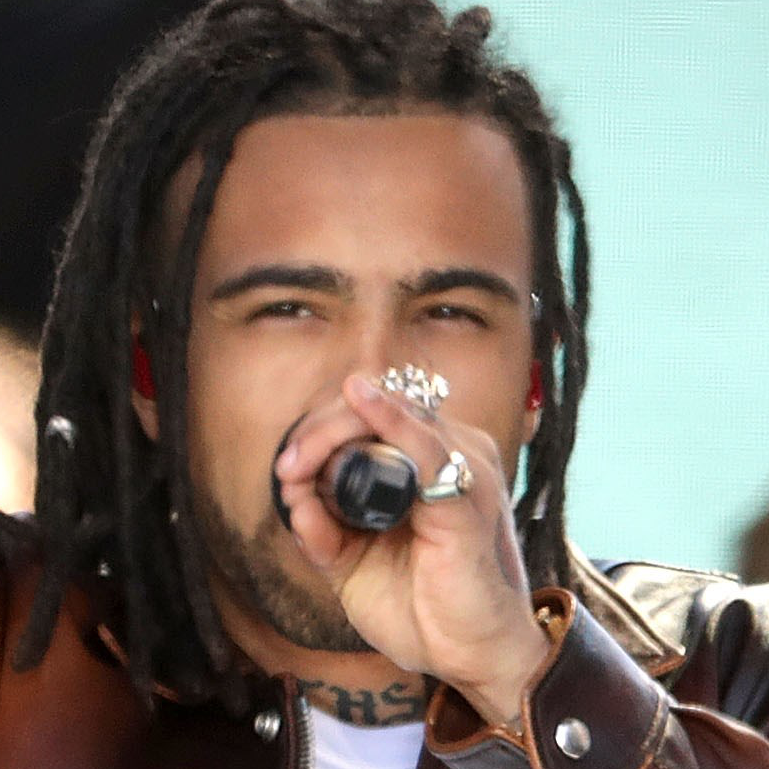

folder  28  is being evaluated
folder  29  is being evaluated
folder  30  is being evaluated
folder  31  is being evaluated
folder  32  is being evaluated
folder  33  is being evaluated
folder  34  is being evaluated
folder  35  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  2


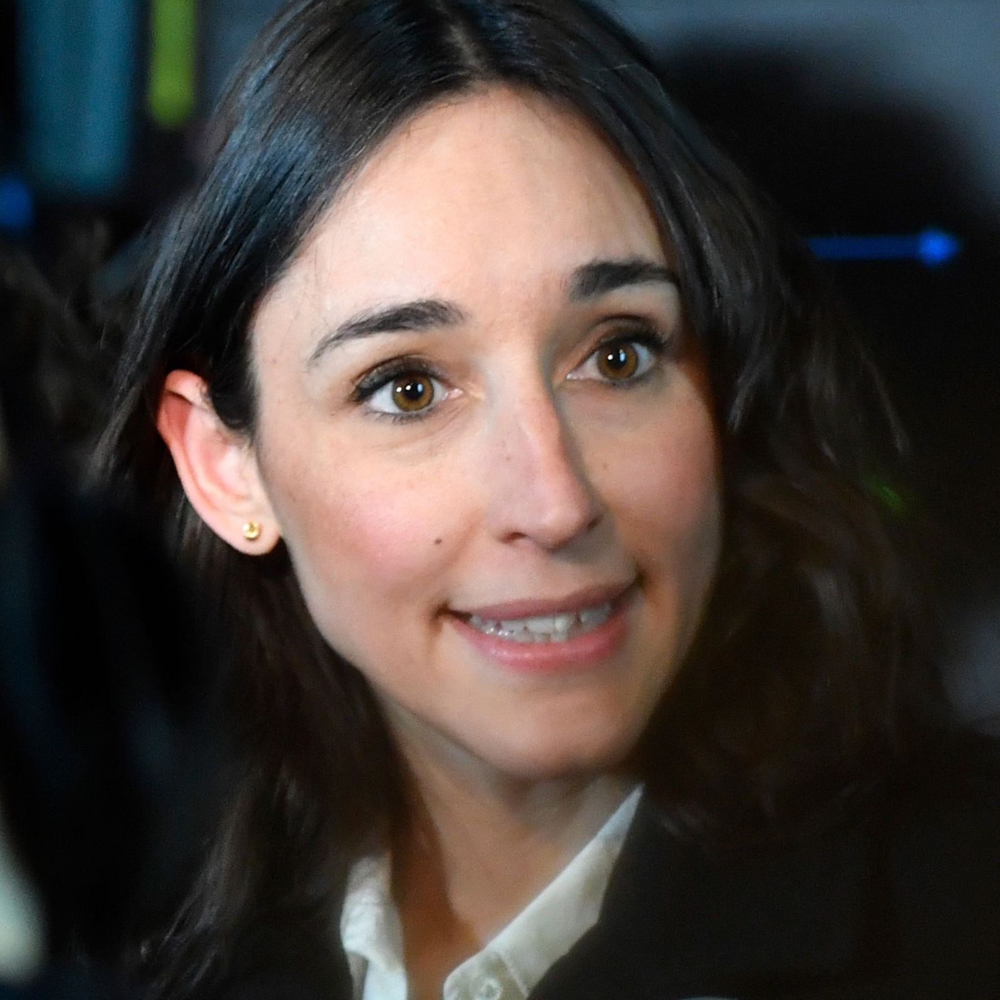

folder  36  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  0


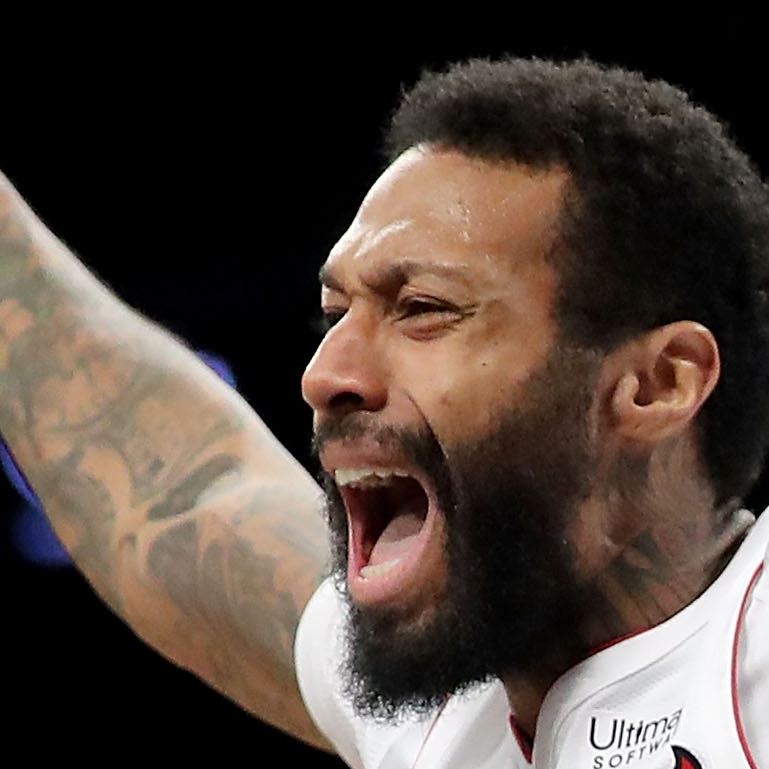

folder  37  is being evaluated
folder  38  is being evaluated
folder  39  is being evaluated
folder  40  is being evaluated
folder  41  is being evaluated
folder  42  is being evaluated
folder  43  is being evaluated
folder  44  is being evaluated
folder  45  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  0


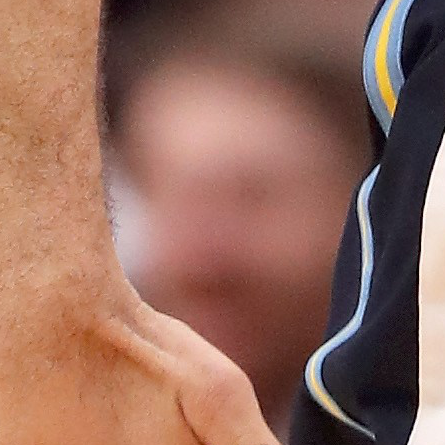

Cette photo est mal encodé par l'encodeur -> output shape :  0


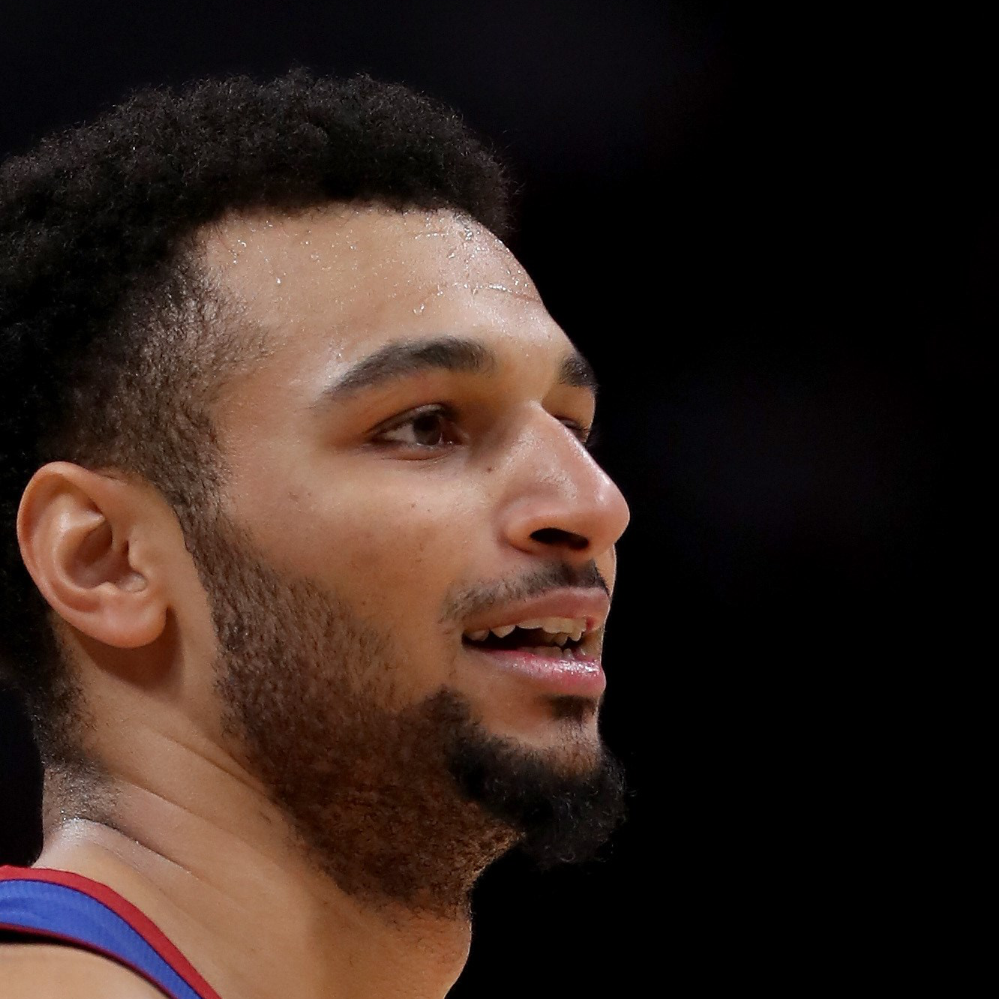

folder  46  is being evaluated
folder  47  is being evaluated
Cette photo est mal encodé par l'encodeur -> output shape :  0


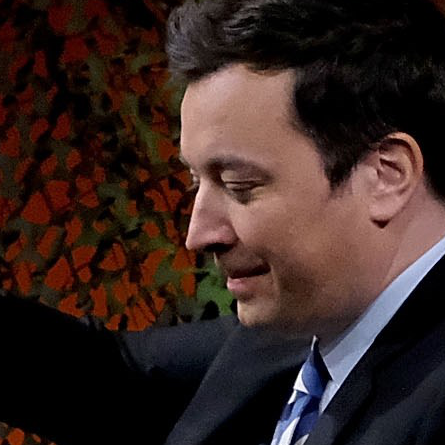

folder  48  is being evaluated


In [3]:
import face_recognition

Database="/home/maachou/ml/Projet_S4/face-database/"

encodages={}
truth={}

for i in range(folders.shape[0]):
        
    name=folders[i][0]
    print("folder ",i," is being evaluated")
    num_pictures=len(os.listdir(Database+folders[i][0]+"/"))
    X=np.zeros((num_pictures,128))
    Y=np.zeros((num_pictures,1))
    k=0
    for photo in os.listdir(Database+folders[i][0]+'/'):
            
        if face_recognition.api.face_encodings(face_recognition.load_image_file(Database+folders[i][0]+"/"+photo))!=[] and np.array(face_recognition.api.face_encodings(face_recognition.load_image_file(Database+folders[i][0]+"/"+photo))).shape[0]!=2: 
                X[k,:]=np.array(face_recognition.api.face_encodings(face_recognition.load_image_file(Database+folders[i][0]+"/"+photo)))
        else:
            print("Cette photo est mal encodé par l'encodeur -> output shape : ",np.array(face_recognition.api.face_encodings(face_recognition.load_image_file(Database+folders[i][0]+"/"+photo))).shape[0])
            display(Image(filename=Database+folders[i][0]+"/"+photo))
        Y[k]=np.array(Annotation_dic[Database+folders[i][0]+"/"+photo],dtype=int)
        k+=1
    encodages[name]=X
    truth[name]=Y

In [4]:
f = open("Encodages_metriques.pkl","wb")
pickle.dump(encodages,f)
f.close()

In [7]:
f = open("Y_truth.pkl","wb")
pickle.dump(truth,f)
f.close()

In [26]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.cluster import MeanShift
from sklearn.cluster import estimate_bandwidth
def evaluate_meanshift(encodages,truth,quant):
    TP=0
    TN=0
    FP=0
    FN=0
    for name in encodages.keys():
        
        Y_pred=MeanShift(estimate_bandwidth(encodages[name],quantile=quant)).fit_predict(encodages[name])
        Y_pred_bin=to_binary(Y_pred).reshape((-1,1))
        confusion=confusion_matrix(truth[name],Y_pred_bin)
        tn, fp, fn, tp = confusion_matrix(truth[name],Y_pred_bin,labels=[0,1]).ravel()
        TP+=tp
        TN+=tn
        FN+=fn
        FP+=fp
    accuracy=(TP+TN)/(FP+FN+TP+TN)
    precision=TP/(TP+FP)
    recall=TP/(TP+FN)
    f1_score=2*(precision*recall)/(precision+recall)
    
    
    print("Accuracy : ",accuracy)
    print("f1_score : ",f1_score)
    conf=np.array([[TN,FP],[FN,TP]])
    
        

    return accuracy,f1_score,conf 
        
        

In [28]:

quantiles=np.linspace(0.5,1,20)
best_score=0
best_quant=None
for quant in quantiles:
    acc,f,conf=evaluate_meanshift(encodages,truth,quant)
    if f>best_score:
        best_score=f
        best_quant=quant
print("best f1 score: ",best_score)
print("best quantile : ",best_quant)

0.38471214596569486
0.6867867017854644
0.22820924833970638
0.5729182150749382
0.3961471166957163
0.8410541484968908
0.6036444968198527
0.27479491618059293
0.4844389952727537
9.934107462565104e-09
2.7140486315577003e-08
0.4430614347825637
0.3930995522760396
0.4553131380211595
0.562357079076848
0.47394966335701183
0.47626773688862695
0.4055946413084291
0.6201511506050402
0.6139179687951307
0.4013632139595109
0.44298907105065244
0.2654941262330278
0.22355291700679142
0.5909178490607667
0.6445277439795205
0.3045481034938433
0.6637058088269806
0.5985856926187705
0.5021064073175032
0.5711020064668714
0.4103164456462691
0.28401999708867487
0.5260079094755267
0.29782059915438336
0.5626469154671127
0.5466164180120392
0.5442825698633579
2.3983056966196446e-08
0.5125413815511646
0.5640909717364194
0.35898299222963975
0.3902868582549777
0.18731112018541324
0.5629348081802056
0.44897223639518785
0.4259103256070413
0.4241572833163683
Accuracy :  0.7296849087893864
f1_score :  0.8368368368368367
0.38

0.43815525520786686
0.5325212869863243
0.41621952646665356
0.22355291700679142
0.6718070586340371
0.691694124144766
0.3314217182391245
0.711932875148464
0.5985856926187705
0.5021064073175032
0.6143596875809542
0.4255096285790813
0.3020864814200402
0.5402024453852308
0.3260946220512887
0.6199382722289175
0.60085623010579
0.7120366601574186
0.477724552484343
0.5125413815511646
0.7045664388216922
0.35898299222963975
0.42158453146993496
0.24984371005442124
0.5629348081802056
0.4883406330570317
0.4594897092316714
0.48178131143572245
Accuracy :  0.7678275290215588
f1_score :  0.8653846153846154
0.4118340791255347
0.8538276690913836
0.26525214435273947
0.6159172096603669
0.42094220680666067
0.8410541484968908
0.6370987641237962
0.32215397959922026
0.5352851787224886
0.4216347012982875
0.3664118606238916
0.47200464645821366
0.4204003842266354
0.4684658170310174
0.625787224451031
0.47394966335701183
0.5120082883996652
0.41787465201922647
0.6765074905325102
0.6998121659921189
0.43815525520786686

0.2757792424109026
0.6270845609475824
0.5868954300988429
0.6028746403358545
0.5718601464004951
Accuracy :  0.8009950248756219
f1_score :  0.8884758364312267
0.44219656240687194
0.9832133059133246
0.2949630253285557
0.6778784814549149
0.4345276806653586
0.8734331632842395
0.7791512502575999
0.3527799587902426
0.5827310393432997
0.4216347012982875
0.3664118606238916
0.5589465156373536
0.4704005922858786
0.5186469163007499
0.7746069978143029
0.511521018468746
0.5756131738910854
0.4335172984738829
0.8830887070071403
0.7746005667544159
0.45489584682387463
0.6070838356398877
0.5784840379343882
0.33708749882071354
0.7582157871045703
1.4416569929183964
0.3523323866572879
0.9018519886165137
0.708500572609382
0.5431369321232015
0.8188723529709239
0.47380884843846577
0.34719561530975507
0.7820687223116736
0.3537414574011909
0.9607988903430651
0.7550960342782734
0.8261467866898553
0.477724552484343
0.552187249872493
0.7338057448530186
0.5292913828122662
0.45007526221873057
0.2757792424109026
0.627

In [35]:
def evaluate(model,encodages,truth):
    TP=0
    TN=0
    FP=0
    FN=0
    for name in encodages.keys():
        
        Y_pred=model.fit_predict(encodages[name])
        Y_pred_bin=to_binary(Y_pred).reshape((-1,1))
        confusion=confusion_matrix(truth[name],Y_pred_bin)
        tn, fp, fn, tp = confusion_matrix(truth[name],Y_pred_bin,labels=[0,1]).ravel()
        TP+=tp
        TN+=tn
        FN+=fn
        FP+=fp
    accuracy=(TP+TN)/(FP+FN+TP+TN)
    precision=TP/(TP+FP)
    recall=TP/(TP+FN)
    f1_score=2*(precision*recall)/(precision+recall)

    conf=np.array([[TN,FP],[FN,TP]])
    
        

    return f1_score

In [38]:
from sklearn.model_selection import GridSearchCV
from sklearn.cluster import DBSCAN
best_score=0
best_params={}
param_grid={'p':[0.1,0.5,1,2,3,4],'min_samples':[0,1,3,5,8,10,20],'leaf_size':[1,3,8,10,30,50]}
for p in param_grid['p']:
    for s in param_grid['min_samples']:
        for l in param_grid['leaf_size']:
            db=DBSCAN(p=p,min_samples=s,leaf_size=l)
            f=evaluate(db,encodages,truth)
            if f>best_score:
                best_score=f
                best_params['p']=p
                best_params['leaf_size']=l
                best_params['min_samples']=s

print("meilleur score: ",best_score)
print("meilleurs parametres",best_params)
    

meilleur score:  0.8346938775510204
meilleurs parametres {'p': 0.1, 'leaf_size': 1, 'min_samples': 0}


In [40]:
from sklearn.svm import OneClassSVM
best_score=0
best_params={}
param_grid={'degree':[1,2,3,4,5],'kernel':["rbf","poly","sigmoid"],"gamma":["auto","scale"]}
for p in param_grid['kernel']:
    for s in param_grid['degree']:
        for l in param_grid['gamma']:
            svm=OneClassSVM(kernel=p,degree=s,gamma=l)
            f=evaluate(svm,encodages,truth)
            if f>best_score:
                best_score=f
                best_params['kernel']=p
                best_params['gamma']=l
                best_params['degree']=s

print("meilleur score: ",best_score)
print("meilleurs parametres",best_params)

meilleur score:  0.7187141216991964
meilleurs parametres {'kernel': 'poly', 'gamma': 'auto', 'degree': 3}
